# Lab 2 Image processing

In [22]:
%pip install pyheif
%pip install pillow-heif

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


## Convert '.heic' to '.png' and save to a cache

In [23]:
from PIL import Image
import numpy as np
from pillow_heif import register_heif_opener
from io import BytesIO

In [24]:
help(register_heif_opener)

Help on function register_heif_opener in module pillow_heif.as_plugin:

register_heif_opener(**kwargs) -> None
    Registers a Pillow plugin for HEIF format.
    
    :param kwargs: dictionary with values to set in options. See: :ref:`options`.



In [25]:
register_heif_opener()
input_file_path = 'bap.heic'
heic_image = Image.open(input_file_path)
output_file_path = 'bap.png'

#create a cache to save photos
image_buffer = BytesIO()
heic_image.save(image_buffer, format='PNG')

#Read image from buffer and convert to numpy array
image_buffer.seek(0)
image_np = np.array(Image.open(image_buffer))

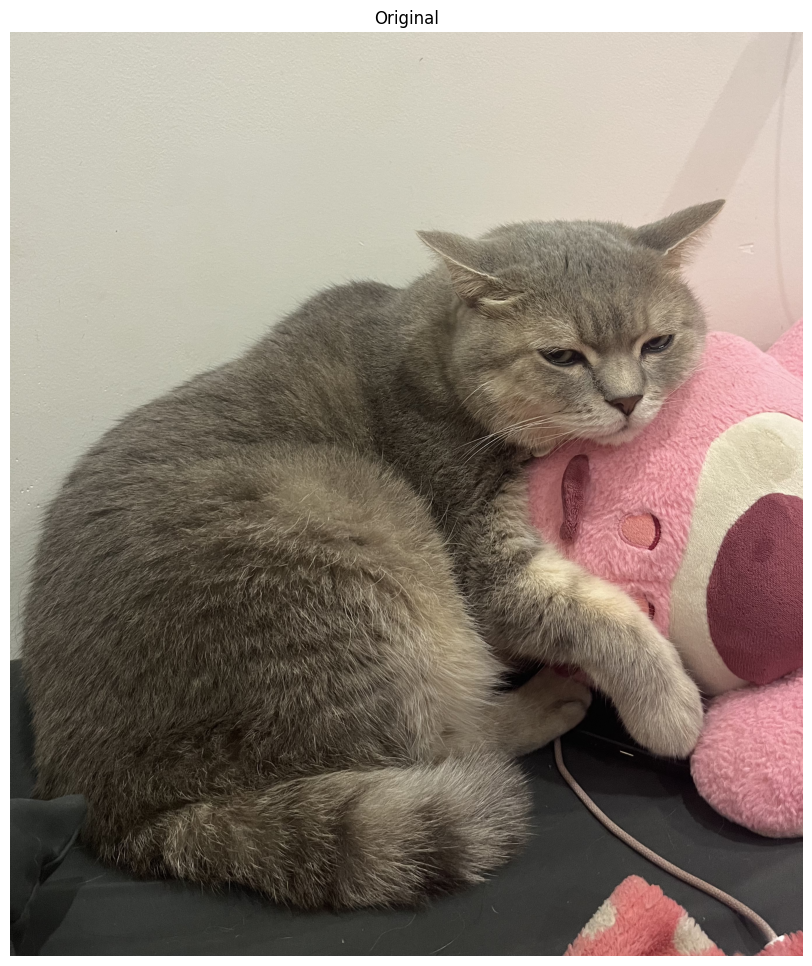

In [26]:
import matplotlib.pyplot as plt
if image_np is None:
    print("Error: Image not loaded.")
else:
    plt.figure(figsize=(18, 12))
    plt.subplot(111), plt.imshow(image_np), plt.title('Original')
    plt.axis('off')

In [27]:
import cv2 as cv

# Requirement 1: Color Conversions

In [28]:
# Convert RGB to BGR as OpenCV uses BGR format
image = cv.cvtColor(image_np, cv.COLOR_RGB2BGR)

In [29]:
# Grayscale 
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
color_mapped_image = cv.applyColorMap(gray_image, cv.COLORMAP_PINK)

# HSV 
hsv_image = cv.cvtColor(image, cv.COLOR_BGR2HSV)
hsv_image[:, :, 0] = (hsv_image[:, :, 0] + 30) % 180 
hsv_enhanced_image = cv.cvtColor(hsv_image, cv.COLOR_HSV2BGR)

# Convert Grayscale to Binary
_, binary_image = cv.threshold(gray_image, 128, 255, cv.THRESH_BINARY)

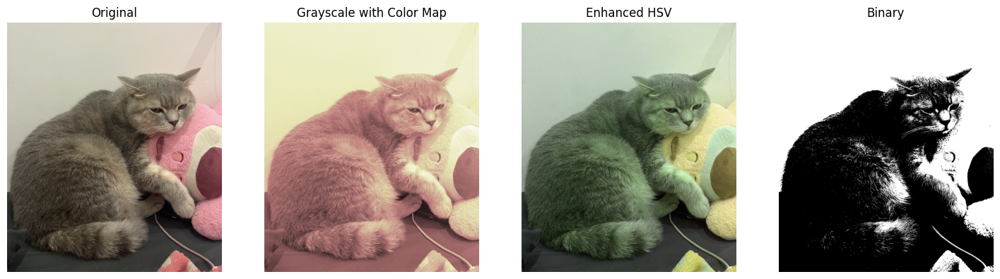

In [30]:
# Display the results
plt.figure(figsize=(18, 12))

plt.subplot(141), plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB)), plt.title('Original')
plt.axis('off')

plt.subplot(142), plt.imshow(cv.cvtColor(color_mapped_image, cv.COLOR_BGR2RGB)), plt.title('Grayscale with Color Map')
plt.axis('off')

plt.subplot(143), plt.imshow(cv.cvtColor(hsv_enhanced_image, cv.COLOR_BGR2RGB)), plt.title('Enhanced HSV')
plt.axis('off')

plt.subplot(144), plt.imshow(binary_image, cmap='gray'), plt.title('Binary')
plt.axis('off')

plt.show()

# Requirement 2: Linear and Non-linear Filters

## Linear:

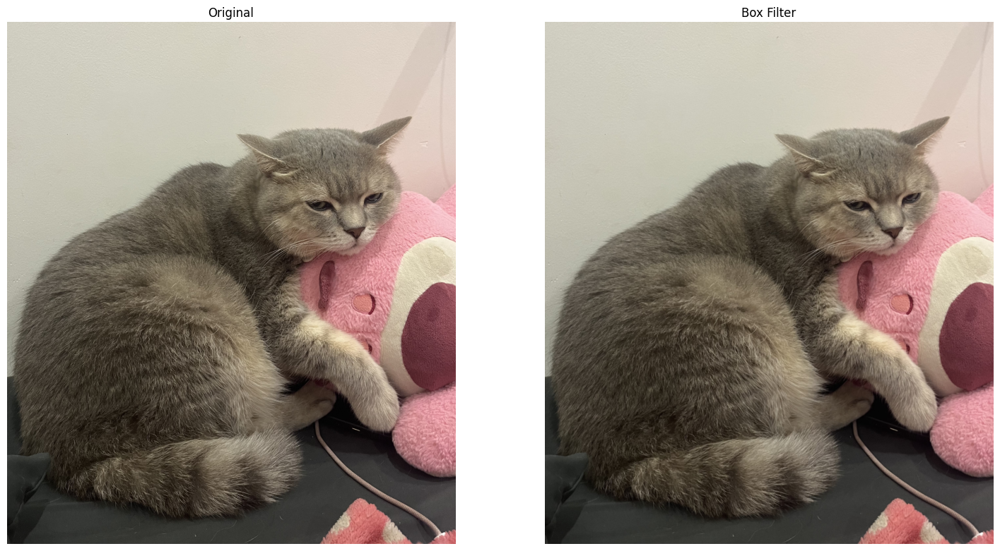

In [31]:
#Box Filter
box_filtered_image = cv.boxFilter(image, -10, (5, 5))

plt.figure(figsize=(18, 12))
plt.subplot(121), plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB)), plt.title('Original')
plt.axis('off')

plt.subplot(122), plt.imshow(cv.cvtColor(box_filtered_image, cv.COLOR_BGR2RGB)), plt.title('Box Filter')
plt.axis('off')
plt.show()

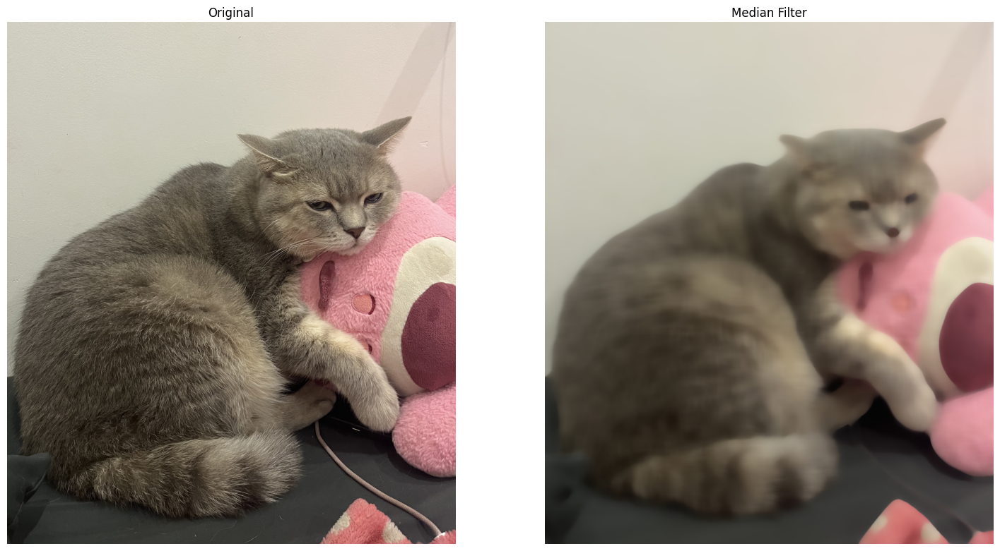

In [32]:
#Median Filter
median_filtered_image = cv.medianBlur(image, 71)

plt.figure(figsize=(18, 12))
plt.subplot(121), plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB)), plt.title('Original')
plt.axis('off')

plt.subplot(122), plt.imshow(cv.cvtColor(median_filtered_image, cv.COLOR_BGR2RGB)), plt.title('Median Filter')
plt.axis('off')
plt.show()

## Non-Linear Filter:

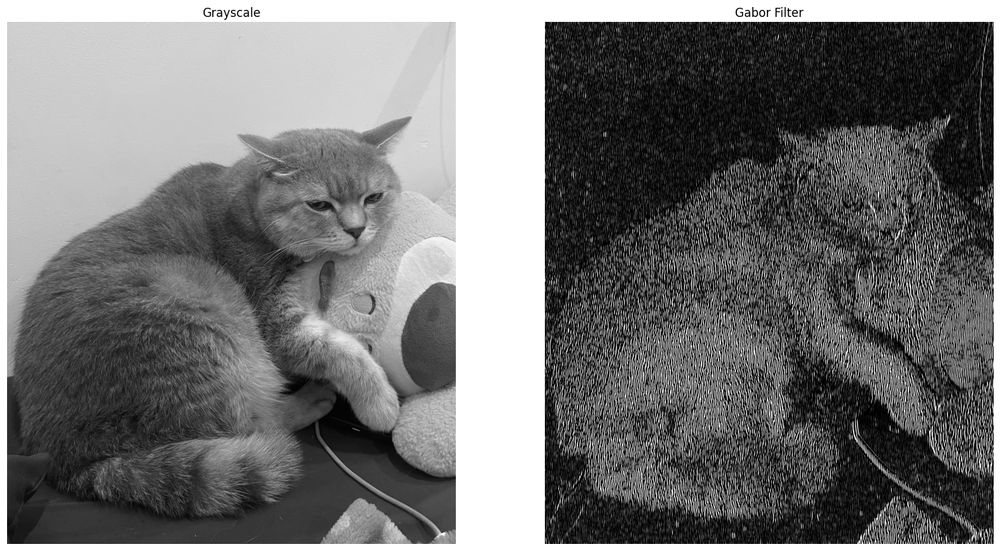

In [33]:
#Gabor Filter
ksize = 31  # kernel size
sigma = 5   # standard deviation of the kernel
theta = 0   # orientation of the kernel
lambda_val = 10  # wavelength of the sinusoidal factor
gamma = 0.5  # spatial aspect ratio

#Create Gabor Kernel
gabor_kernel = cv.getGaborKernel((ksize, ksize), sigma, theta, lambda_val, gamma)

gabor_filtered_image = cv.filter2D(gray_image, cv.CV_8UC3, gabor_kernel)

plt.figure(figsize=(18, 12))
plt.subplot(121), plt.imshow(gray_image, cmap='gray'), plt.title('Grayscale')
plt.axis('off')

plt.subplot(122), plt.imshow(gabor_filtered_image, cmap='gray'), plt.title('Gabor Filter')
plt.axis('off')
plt.show()

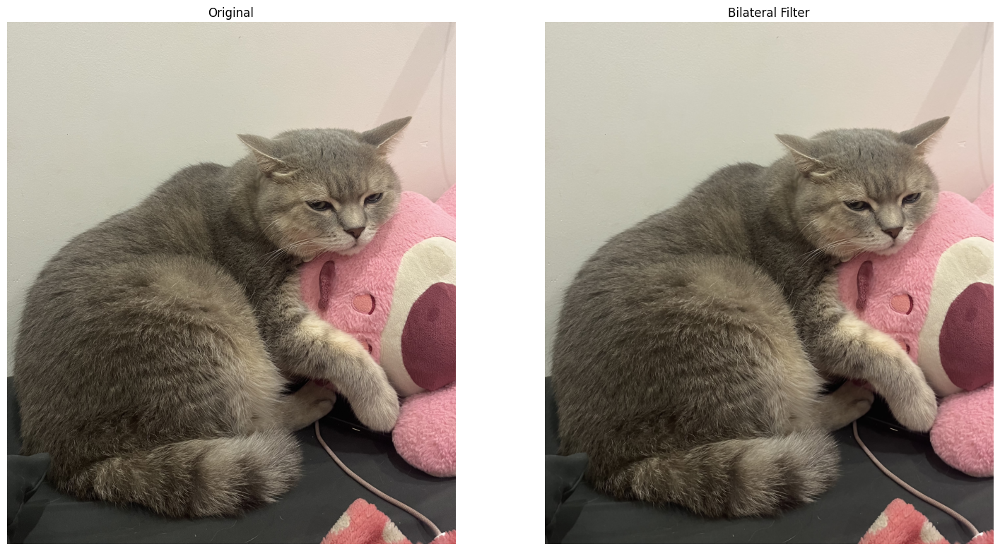

In [34]:
#Bilateral Filter
bilateral_filtered_image = cv.bilateralFilter(image, 9, 50, 75)

plt.figure(figsize=(18, 12))
plt.subplot(121), plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB)), plt.title('Original')
plt.axis('off')

plt.subplot(122), plt.imshow(cv.cvtColor(bilateral_filtered_image, cv.COLOR_BGR2RGB)), plt.title('Bilateral Filter')
plt.axis('off')
plt.show()


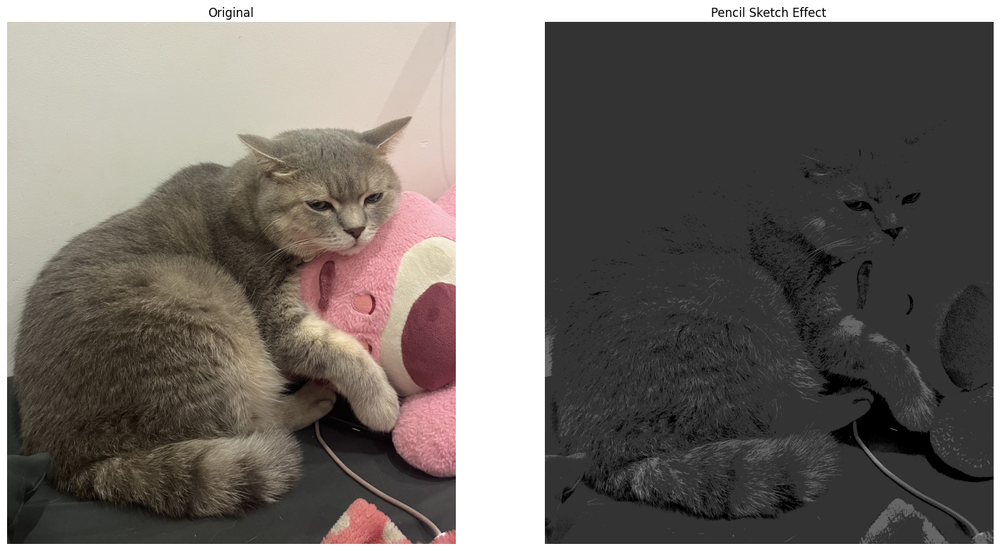

In [35]:
#Pencil Sketch Effect
def pencil_sketch(image, scale=1):
    #Convert image to grayscale
    gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

    #Invert the grayscale image
    inverted_image = cv.bitwise_not(gray_image)

    #Apply Gaussian Blur
    blurred_image = cv.GaussianBlur(inverted_image, (1111, 1111), -50)

    #Invert the blurred image
    inverted_blurred = cv.bitwise_not(blurred_image)

    #Create pencil sketch effect
    pencil_sketch = cv.divide(gray_image, inverted_blurred, scale=scale)

    return pencil_sketch

#Apply Pencil Sketch Effect
sketch_image = pencil_sketch(image)

plt.figure(figsize=(18, 12))
plt.subplot(121), plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB)), plt.title('Original')
plt.axis('off')

plt.subplot(122), plt.imshow(sketch_image, cmap='gray'), plt.title('Pencil Sketch Effect')
plt.axis('off')
plt.show()

# Requirement 3: Fourier Transform

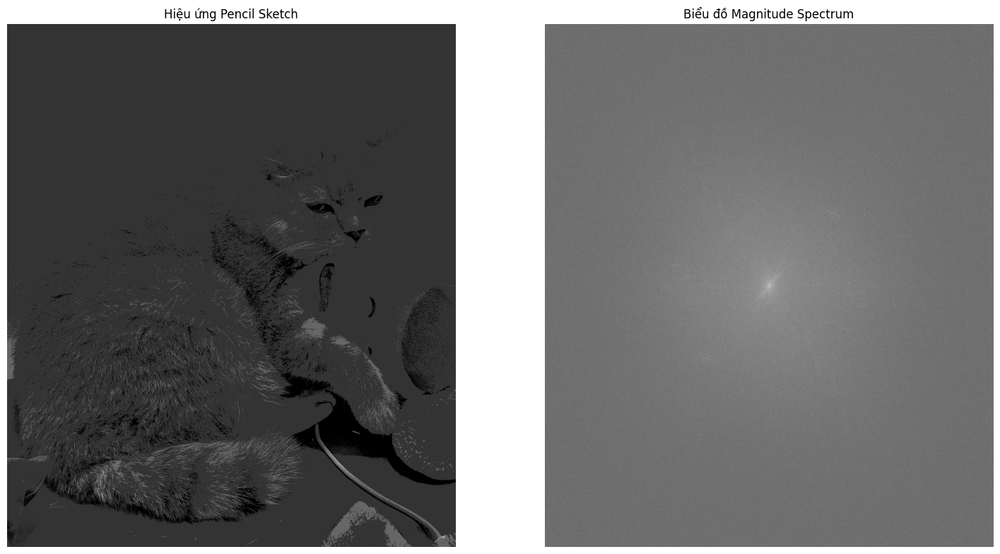

In [36]:
#Fourier Transform
f_transform = np.fft.fft2(sketch_image)
f_shift = np.fft.fftshift(f_transform)
magnitude_spectrum = 20 * np.log(np.abs(f_shift))

plt.figure(figsize=(18, 12))
plt.subplot(121), plt.imshow(sketch_image, cmap='gray'), plt.title('Hiệu ứng Pencil Sketch')
plt.axis('off')

plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray'), plt.title('Biểu đồ Magnitude Spectrum')
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


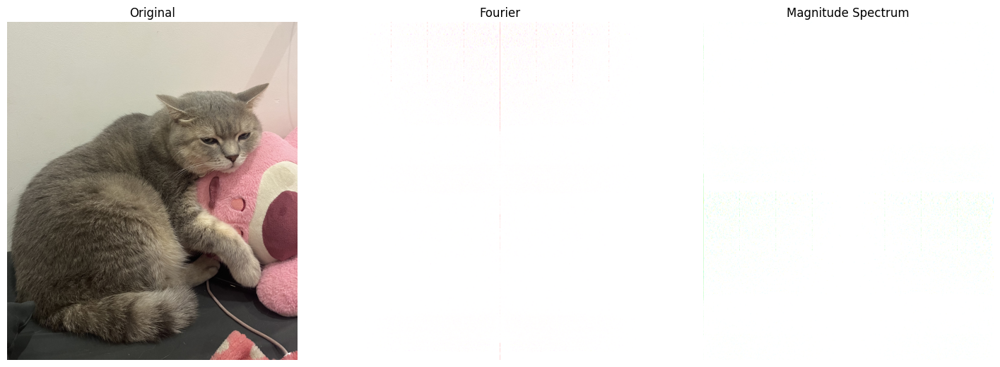

In [37]:
# Fourier Transform
f_transform = np.fft.fft2(image)
f_shift = np.fft.fftshift(f_transform)
magnitude_spectrum = 20 * np.log(np.abs(f_shift))

plt.figure(figsize=(18, 12))
plt.subplot(131), plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB)), plt.title('Original')
plt.axis('off')

plt.subplot(132), plt.imshow(np.log(1 + np.abs(f_transform)), cmap='gray'), plt.title('Fourier')
plt.axis('off')

plt.subplot(133), plt.imshow(magnitude_spectrum, cmap='gray'), plt.title('Magnitude Spectrum')
plt.axis('off')

plt.show()